In [1]:
# Install required libraries
!pip install ultralytics pandas matplotlib roboflow

import os
import shutil
import pandas as pd
import yaml
import cv2
import numpy as np
from google.colab import files, output
from ultralytics import YOLO
from matplotlib import pyplot as plt
from roboflow import Roboflow

# --- 🎯 CRITICAL USER CONFIGURATION ---
KNOWN_REFERENCE_WIDTH_INCHES = 18.0
TARGET_CLASS_NAME = "qblock"
# ------------------------------------------

# --- Roboflow Download and Path Setup ---
print("--- 🛠️ Phase 1: Setup and Data Download ---")

# Execute your Roboflow download code
rf = Roboflow(api_key="34aeVIOAX5XcJCubVAHR")
project = rf.workspace("nissha-medical").project("eagle-eyes-tbhgj")
version = project.version(24)
dataset = version.download("yolov8")

# Dynamically set paths
dataset_root_path = dataset.location
yaml_path = os.path.join(dataset_root_path, 'data.yaml')
WEIGHTS_FOLDER = '/content/runs/detect/barcode_detector_run/weights'
WEIGHTS_PATH = os.path.join(WEIGHTS_FOLDER, 'best.pt')

# --- Load YAML to get Class IDs ---
try:
    with open(yaml_path, 'r') as f:
        data_config = yaml.safe_load(f)

    class_names = data_config['names']

    try:
        target_class_id = class_names.index(TARGET_CLASS_NAME)
        target_class_ids_list = [target_class_id]
    except ValueError:
        print(f"FATAL ERROR: Target class '{TARGET_CLASS_NAME}' not found in data.yaml. Check your class name!")
        exit()

except Exception as e:
    print(f"FATAL ERROR: Could not load or parse data.yaml. Error: {e}")
    exit()

# --- 📊 Image and Annotation Counting ---
print("\n--- 📊 Data Integrity Check: Counting Images and Annotations ---")

# 1. Image Counting by Split
def count_images_by_split(base_path):
    counts = {}
    total = 0
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(base_path, split, 'images')
        if os.path.isdir(img_dir):
            count = len([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))])
            counts[split] = count
            total += count
        else:
            counts[split] = 0
    counts['total'] = total
    return counts

# 2. Annotation Counting
def count_annotations(base_path, target_id_str):
    count = 0
    for split in ['train', 'valid', 'test']:
        label_dir = os.path.join(base_path, split, 'labels')
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                if filename.endswith('.txt'):
                    with open(os.path.join(label_dir, filename), 'r') as f:
                        for line in f:
                            if line.strip().startswith(target_id_str):
                                count += 1
    return count

image_counts = count_images_by_split(dataset_root_path)
total_qblock_annotations = count_annotations(dataset_root_path, str(target_class_id))

print(f"Total Images Found: {image_counts['total']}")
print(f"  ├── Train Images: {image_counts['train']}")
print(f"  ├── Valid Images: {image_counts['valid']}")
print(f"  └── Test Images: {image_counts['test']}")

print(f"\nTotal '{TARGET_CLASS_NAME}' Annotations Found: {total_qblock_annotations}")
if image_counts['total'] > 0:
    print(f"Average '{TARGET_CLASS_NAME}' Annotations per Image: {total_qblock_annotations / image_counts['total']:.2f}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 85.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 143.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings wit


Extracting Dataset Version Zip to eagle-eyes-24 in yolov8:: 100%|██████████| 3538/3538 [00:00<00:00, 7425.76it/s]



--- 📊 Data Integrity Check: Counting Images and Annotations ---
Total Images Found: 1763
  ├── Train Images: 1189
  ├── Valid Images: 350
  └── Test Images: 224

Total 'qblock' Annotations Found: 9008
Average 'qblock' Annotations per Image: 5.11


In [2]:
# --- 📊 Data Integrity Check ---
print("\n--- 📊 Data Integrity Check: Counting Images and Annotations ---")

# 1. Image Counting
def count_images(base_path):
    count = 0
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(base_path, split, 'images')
        if os.path.isdir(img_dir):
            count += len([f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))])
    return count

# 2. Annotation Counting (Counts lines starting with the target class ID)
def count_annotations(base_path, target_id_str):
    count = 0
    for split in ['train', 'valid', 'test']:
        label_dir = os.path.join(base_path, split, 'labels')
        if os.path.isdir(label_dir):
            for filename in os.listdir(label_dir):
                if filename.endswith('.txt'):
                    with open(os.path.join(label_dir, filename), 'r') as f:
                        for line in f:
                            if line.strip().startswith(target_id_str):
                                count += 1
    return count

total_images = count_images(dataset_root_path)
total_qblock_annotations = count_annotations(dataset_root_path, str(target_class_id))

print(f"Total Images Found: {total_images}")
print(f"Total '{TARGET_CLASS_NAME}' Annotations Found: {total_qblock_annotations}")
if total_images > 0:
    print(f"Average '{TARGET_CLASS_NAME}' Annotations per Image: {total_qblock_annotations / total_images:.2f}")


--- 📊 Data Integrity Check: Counting Images and Annotations ---
Total Images Found: 1763
Total 'qblock' Annotations Found: 9008
Average 'qblock' Annotations per Image: 5.11


In [3]:
# --- 🧠 Phase 2: Training YOLOv8 Model (50 Epochs for Accuracy) ---
print("\n--- 🧠 Phase 2: Training YOLOv8 Model ---")
print("Starting training. This requires a GPU runtime.")

try:
    model = YOLO('yolov8n.pt')

    # epochs=50 for good accuracy. batch=8 is set for stability (reduced from 16).
    results = model.train(
        data=yaml_path,
        epochs=50,
        imgsz=1024,
        batch=8, # CRITICAL: Adjust this if you get OOM errors
        name='barcode_detector_run'
    )
    print("Training complete. Weights are saved.")
except Exception as e:
    print(f"FATAL ERROR during training. Review output for OOM error. Error: {e}")


--- 🧠 Phase 2: Training YOLOv8 Model ---
Starting training. This requires a GPU runtime.
Ultralytics 8.3.231 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/eagle-eyes-24/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=barcode_detector_run, nbs=64, nms=False, ops

In [4]:
# --- Setup Phase 3: Verification ---
print("\n--- Setup Phase 3: Verification ---")

if not os.path.exists(WEIGHTS_PATH):
    print(f"FATAL ERROR: Trained weights not found at {WEIGHTS_PATH}. Cell 3 failed to complete.")
    exit()

model = YOLO(WEIGHTS_PATH)
print("Trained model loaded successfully.")

# Set the path to the validation images
VAL_IMAGES_DIR = os.path.join(dataset_root_path, 'valid', 'images')
validation_image_paths = [os.path.join(VAL_IMAGES_DIR, f) for f in os.listdir(VAL_IMAGES_DIR) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

if not validation_image_paths:
    print(f"FATAL ERROR: No validation images found in the expected directory: {VAL_IMAGES_DIR}")
    exit()


--- Setup Phase 3: Verification ---
Trained model loaded successfully.



--- 📏 Phase 3a: Visualization and Initial Measurement ---


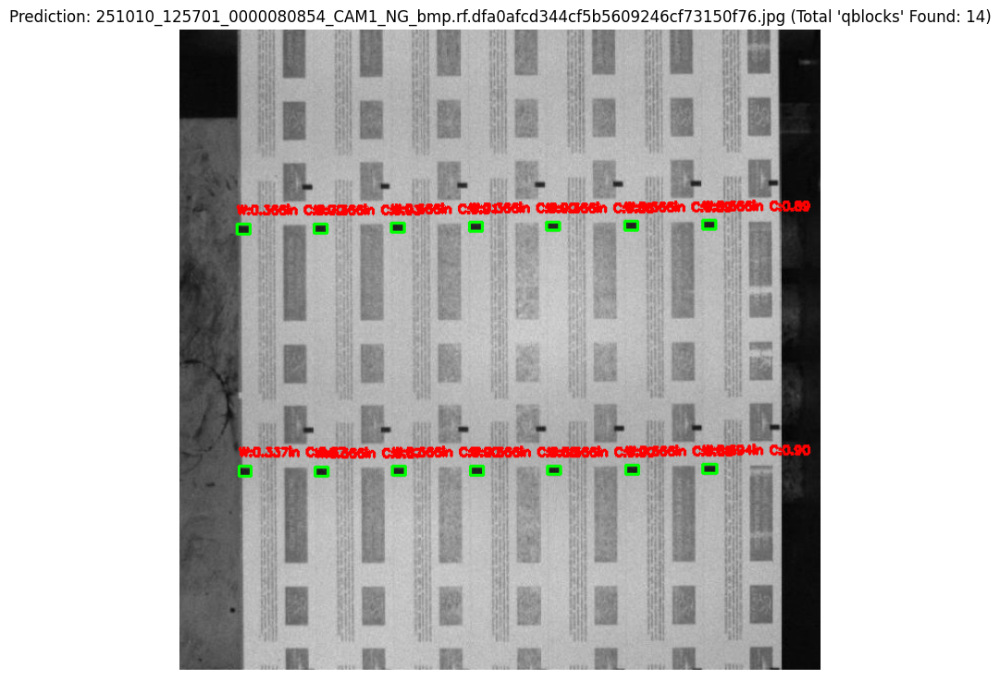

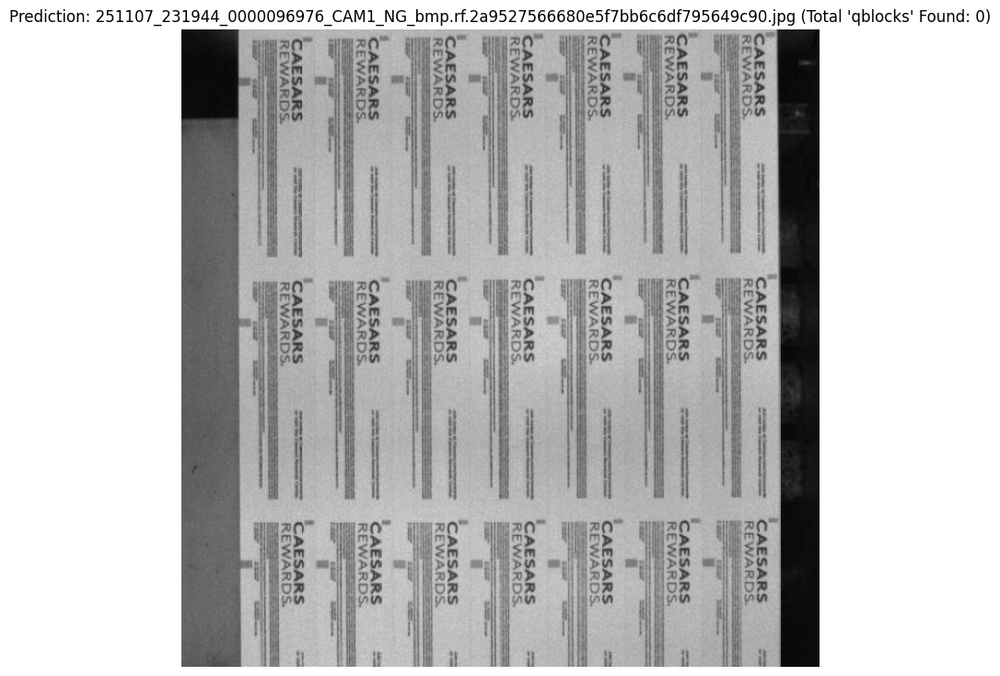

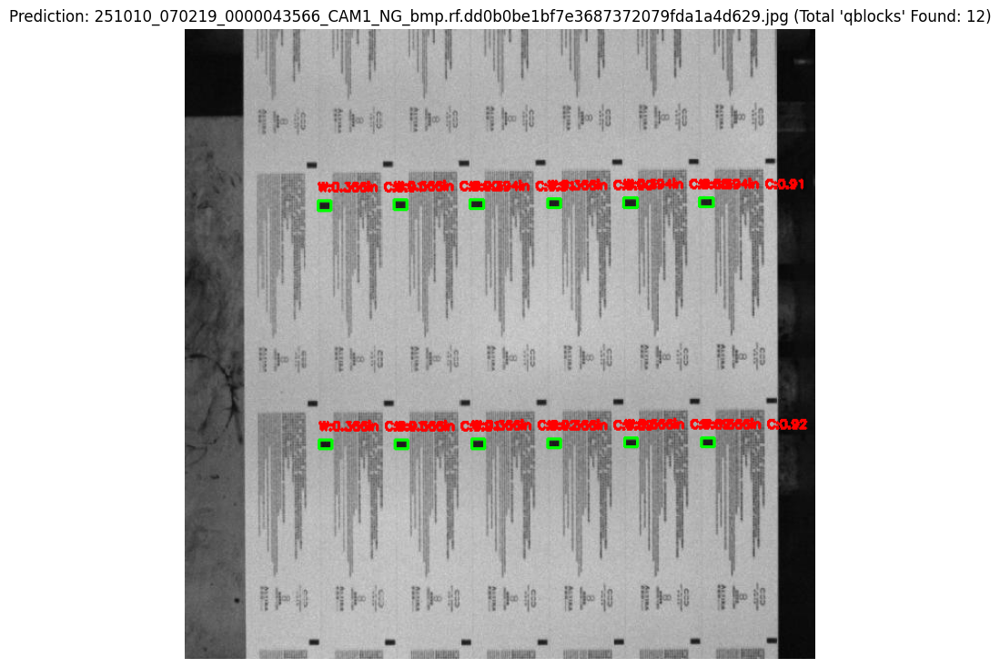

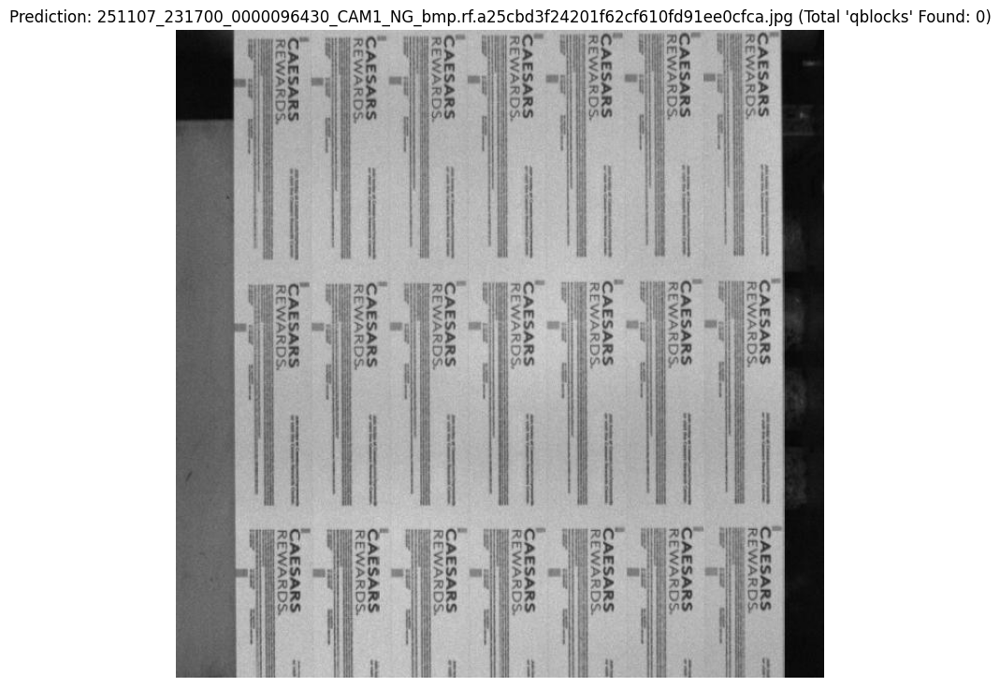

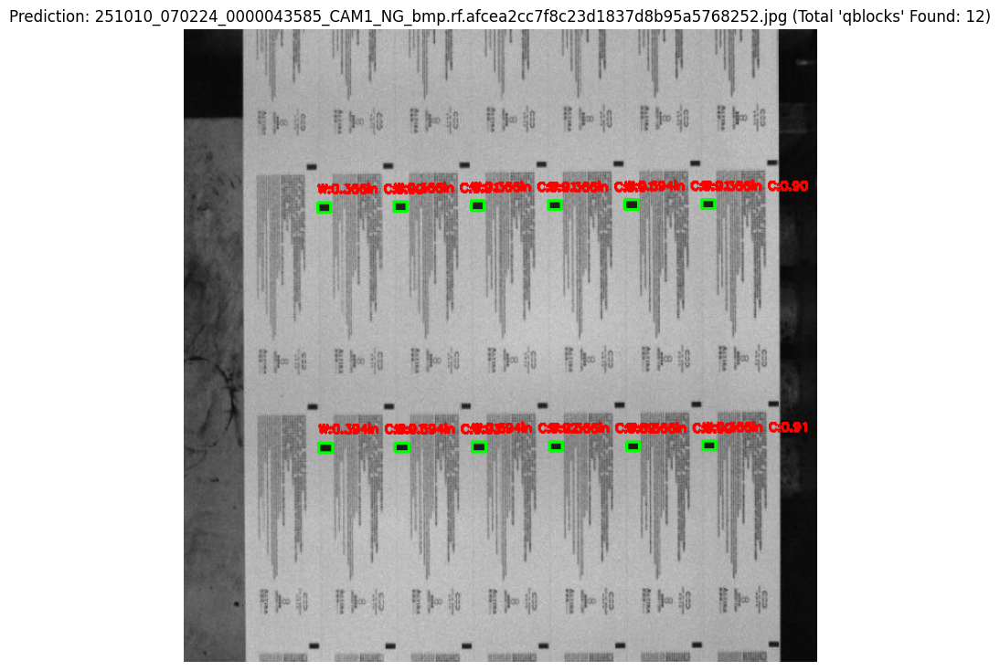

...

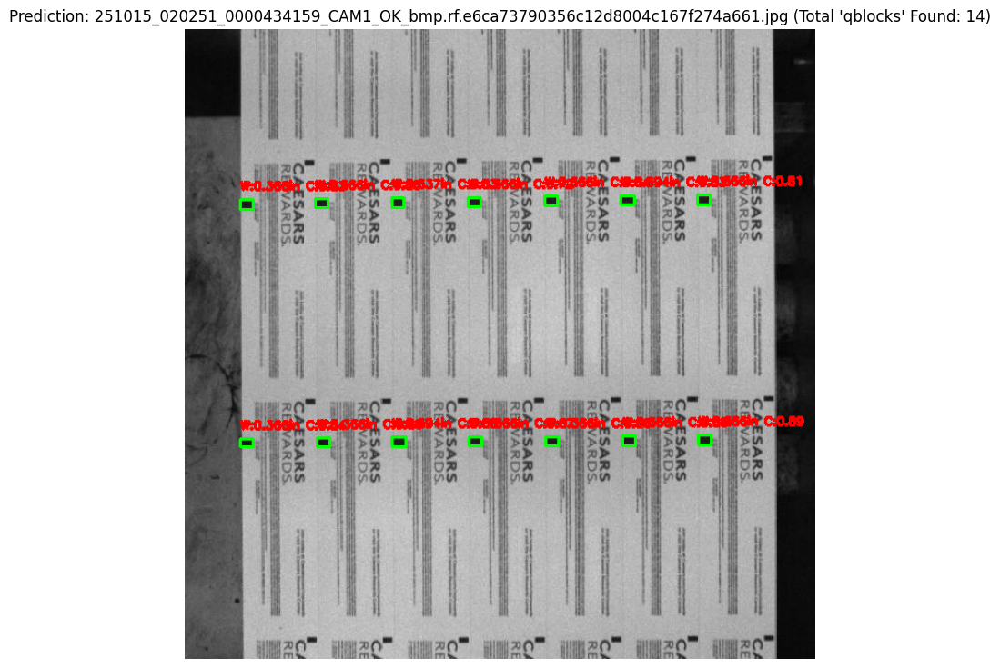

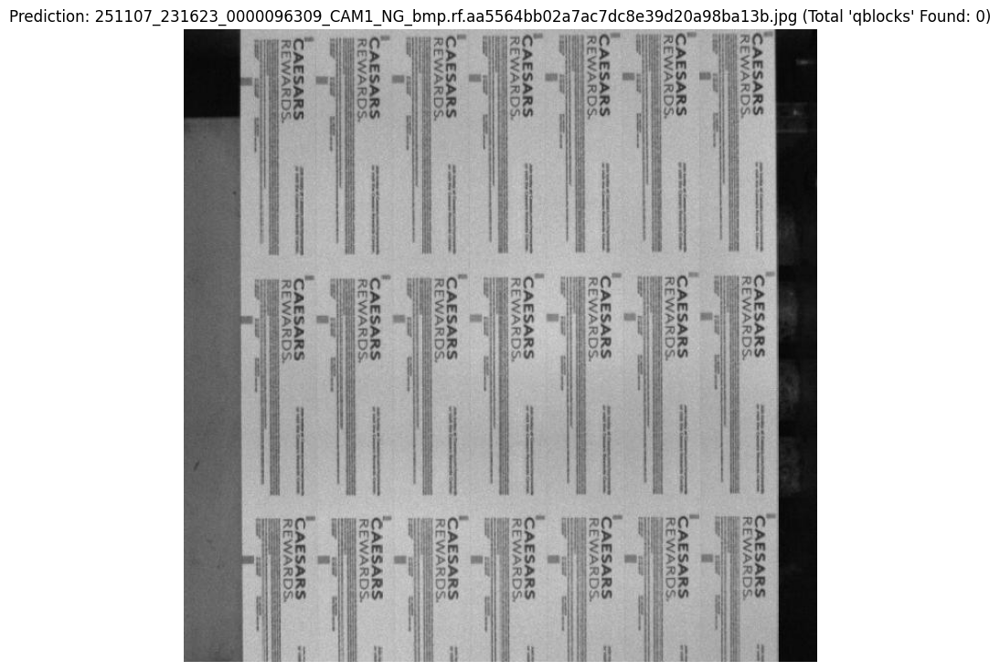

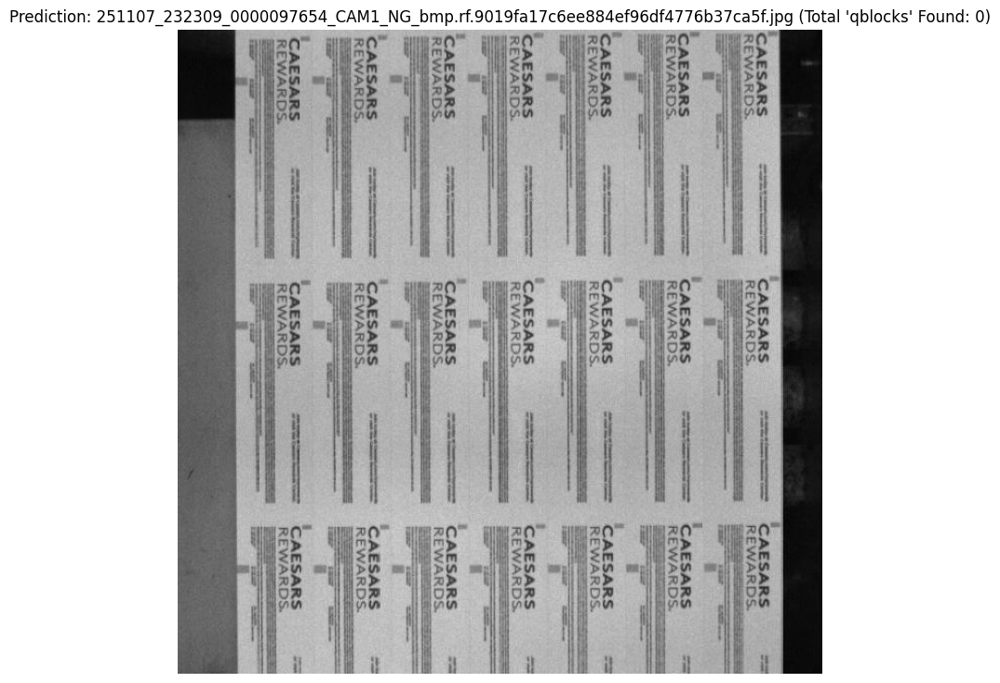

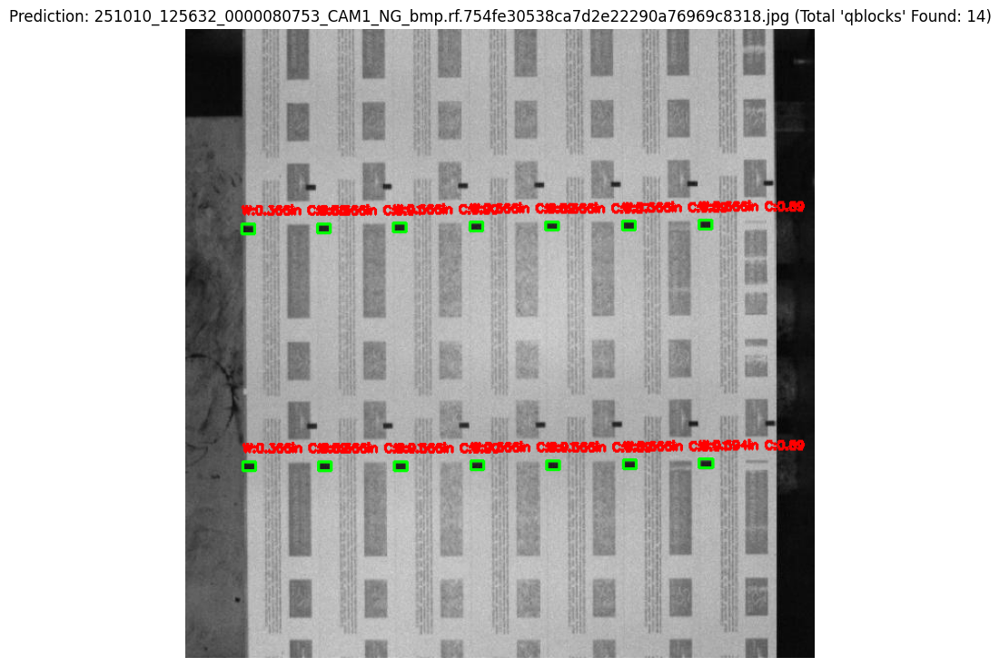

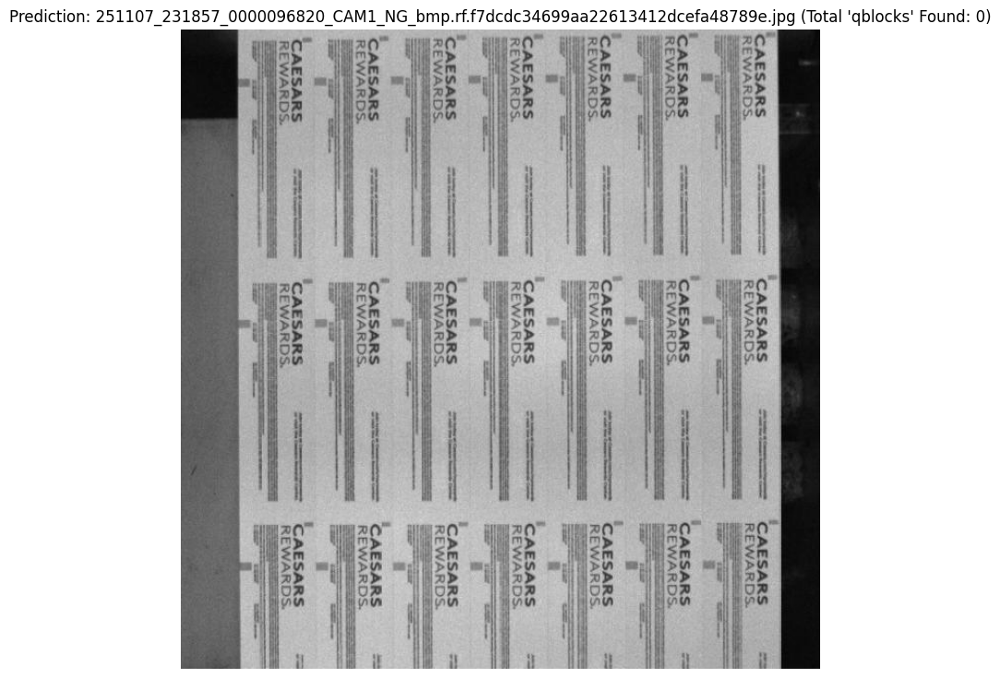

Initial visualization complete. Proceeding to full batch measurement.


In [8]:
# --- 📏 Phase 3a: Visualization and Initial Measurement ---
print("\n--- 📏 Phase 3a: Visualization and Initial Measurement ---")

all_measurement_data = []
IMAGES_TO_VISUALIZE = 20 # Display the first 3 images for conviction
# Set highly permissive filters to capture all potential detections
CONF_THRESHOLD = 0.01
IOU_THRESHOLD = 0.3

for i, image_path in enumerate(validation_image_paths):
    if i >= IMAGES_TO_VISUALIZE:
        break

    # 1. Run Detection
    results = model.predict(
        source=image_path,
        save=False,
        imgsz=1024,
        conf=CONF_THRESHOLD, # Low confidence to maximize Recall
        iou=IOU_THRESHOLD,   # Low IOU to keep overlapping boxes
        verbose=False,
        classes=target_class_ids_list
    )

    img = cv2.imread(image_path)
    img_annotated = img.copy()

    if img is None: continue

    (img_height, img_width) = img.shape[:2]

    # --- CALIBRATION: PPM calculation ---
    PPM = img_width / KNOWN_REFERENCE_WIDTH_INCHES

    if results[0].boxes is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()

        for j, box in enumerate(boxes):
            xmin, ymin, xmax, ymax = box[:4].astype(int)

            width_pixels = xmax - xmin
            height_pixels = ymax - ymin

            width_inches = width_pixels / PPM
            height_inches = height_pixels / PPM

            all_measurement_data.append({
                "filename": os.path.basename(image_path),
                "Width_in": round(width_inches, 4),
                "Height_in": round(height_inches, 4),
                "Confidence": round(confidences[j], 4)
            })

            # --- VISUALIZATION ANNOTATION ---
            cv2.rectangle(img_annotated, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

            text = f"W:{width_inches:.3f}in C:{confidences[j]:.2f}"
            cv2.putText(img_annotated, text, (xmin, ymin - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 0, 255), 2)

        # Display Image
        plt.figure(figsize=(12, 9))
        plt.imshow(cv2.cvtColor(img_annotated, cv2.COLOR_BGR2RGB))
        plt.title(f"Prediction: {os.path.basename(image_path)} (Total 'qblocks' Found: {len(boxes)})")
        plt.axis('off')
        plt.show()

print("Initial visualization complete. Proceeding to full batch measurement.")

In [6]:
# --- 📊 Phase 3b: Full Batch Measurement ---
print("\n--- 📊 Phase 3b: Full Batch Measurement (Remaining Images) ---")

start_index = 20 # We already processed the first 3 images
total_images_to_process = len(validation_image_paths)

for i in range(start_index, total_images_to_process):
    image_path = validation_image_paths[i]

    # Run Detection
    results = model.predict(
        source=image_path,
        save=False,
        imgsz=640,
        conf=CONF_THRESHOLD, # Use the low threshold defined in Cell 5
        iou=IOU_THRESHOLD,
        verbose=False,
        classes=target_class_ids_list
    )

    img = cv2.imread(image_path)
    if img is None: continue
    (img_height, img_width) = img.shape[:2]

    PPM = img_width / KNOWN_REFERENCE_WIDTH_INCHES

    if results[0].boxes is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        confidences = results[0].boxes.conf.cpu().numpy()

        for j, box in enumerate(boxes):
            xmin, ymin, xmax, ymax = box[:4].astype(int)

            width_pixels = xmax - xmin
            height_pixels = ymax - ymin

            width_inches = width_pixels / PPM
            height_inches = height_pixels / PPM

            all_measurement_data.append({
                "filename": os.path.basename(image_path),
                "Width_in": round(width_inches, 4),
                "Height_in": round(height_inches, 4),
                "Confidence": round(confidences[j], 4)
            })

    if (i - start_index) % 100 == 0 and i != start_index:
        print(f"Processed {i - start_index} additional images...")

print("Batch processing complete.")


--- 📊 Phase 3b: Full Batch Measurement (Remaining Images) ---
Processed 100 additional images...
Processed 200 additional images...
Processed 300 additional images...
Batch processing complete.



Overall Average Width: 0.3661 inches
Overall Average Height: 0.2604 inches


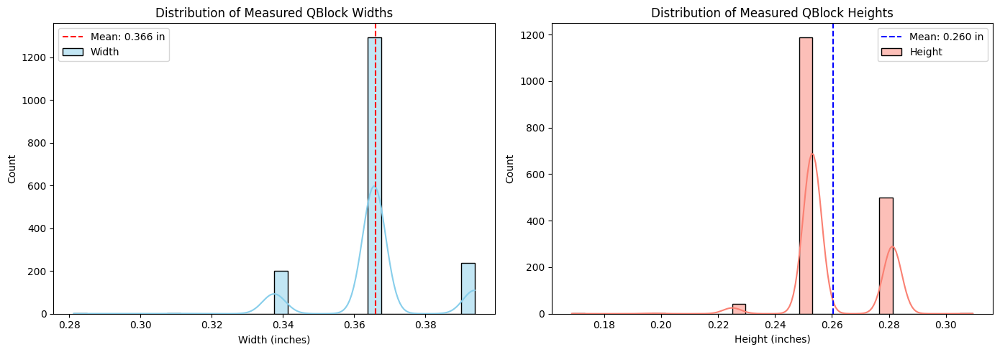

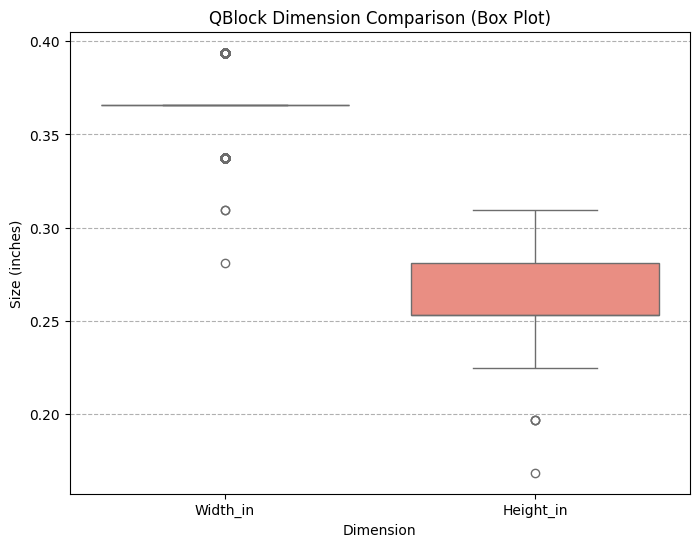


CSV Output: yolov8_qblock_dimensions_summary.csv
Total 'qblocks' measured across all images: 1736
Results saved to yolov8_qblock_dimensions_summary.csv. Downloading now.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [7]:
# --- ⬇️ Cell 7: Final Output, Visualization, and Download ---

# Create final DataFrame from all collected data (Assuming results_df is available from prior cells)
results_df = pd.DataFrame(all_measurement_data)

if not results_df.empty:

    import matplotlib.pyplot as plt
    import seaborn as sns

    # Calculate summary statistics
    avg_width = results_df['Width_in'].mean()
    avg_height = results_df['Height_in'].mean()

    print(f"\nOverall Average Width: {avg_width:.4f} inches")
    print(f"Overall Average Height: {avg_height:.4f} inches")

    # --- 1. Distribution Plot (Width and Height) ---
    plt.figure(figsize=(14, 5))

    # Width Distribution
    plt.subplot(1, 2, 1)
    sns.histplot(results_df['Width_in'], kde=True, bins=30, color='skyblue', label='Width')
    plt.axvline(avg_width, color='red', linestyle='--', label=f'Mean: {avg_width:.3f} in')
    plt.title('Distribution of Measured QBlock Widths')
    plt.xlabel('Width (inches)')
    plt.ylabel('Count')
    plt.legend()

    # Height Distribution
    plt.subplot(1, 2, 2)
    sns.histplot(results_df['Height_in'], kde=True, bins=30, color='salmon', label='Height')
    plt.axvline(avg_height, color='blue', linestyle='--', label=f'Mean: {avg_height:.3f} in')
    plt.title('Distribution of Measured QBlock Heights')
    plt.xlabel('Height (inches)')
    plt.ylabel('Count')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # --- 2. Box Plot (Comparing Width vs. Height) ---
    # Prepare data for combined box plot
    df_box = pd.melt(results_df, value_vars=['Width_in', 'Height_in'], var_name='Dimension', value_name='Size (inches)')

    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Dimension', y='Size (inches)', data=df_box, palette=['skyblue', 'salmon'])
    plt.title('QBlock Dimension Comparison (Box Plot)')
    plt.grid(axis='y', linestyle='--')
    plt.show()


    # --- 3. Final CSV Output ---
    output_csv_filename = "yolov8_qblock_dimensions_summary.csv"
    results_df.to_csv(output_csv_filename, index=False)

    print(f"\nCSV Output: {output_csv_filename}")
    print(f"Total 'qblocks' measured across all images: {len(results_df)}")
    print(f"Results saved to {output_csv_filename}. Downloading now.")
    files.download(output_csv_filename)

else:
    print("\nNo 'qblocks' were successfully detected and measured.")